# Compression with Constraints: Steganography

The natural images are compressible, usually a full size image of several megabytes can be reduced to kilobytes level easily without lossing too much important information. Such property has been used widely to denoising, deblur, etc. techniques. 

The [``steganography``](https://en.wikipedia.org/wiki/Steganography) is a topic lying in the cryptography. It is concealing a file, message, image, or video within another file, message, image, or video. 

The advantage of steganography over cryptography alone is that the intended secret message ***does not attract attention to itself as an object of scrutiny***. Plainly visible encrypted messages, no matter how unbreakable they are, arouse interest and may in themselves be incriminating in countries in which encryption is illegal. 

Whereas cryptography is the practice of protecting the contents of a message alone, steganography is concerned both with concealing the fact that a secret message is being sent and its contents.

Steganography includes the concealment of information within computer files. In digital steganography, electronic communications may include steganographic coding inside of a transport layer, such as a document file, image file, program or protocol. Media files are ideal for steganographic transmission because of their large size. For example, a sender might start with an innocuous image file and adjust the color of every hundredth pixel to correspond to a letter in the alphabet. The change is so subtle that someone who is not specifically looking for it is unlikely to notice the change. 

In this project, we deal with a special case: stegranography with images only. So unlike many practical scenes, for instance, encrypt text, document in images, this task might not be able to produce perfect recovery of information.

## Purpose of the project

The project is not meant to create super powerful technique to conceal information, it is more concerned to get used to imaging processing libraries and optimization techniques. On the other hand, it also provides a challenge to think about how to detect the ``steganographic`` images without the original images.

## Mathematical aspects

The stegranography has two important components: encryption and decryption. 

Suppose you have an original image and a secret image.


1.   Encryption: As a sender, your task is to make the original image and secret image merge into one image. The purpose is two fold. Firstly, your outcome must be an image, if this image stays far away from the original image, then it will attract other people's attention. That will count as a failure. Secondly, your outcome image must also convey the information of the secret image. It is not that simple, since any blending of information will change each other. The problem is how much we can afford.
2.   Decryption: After the encryption part, your outcome image will have two parts of information coming from original image and the secret image. As the receiver, your task will be inverting the encryption process, to recover the secret image as much as possible (Caution,  the receiver do not care about original image). 

If we mathematically represent such process, let $x$ be the original image, $y$ is the secret image, then $z = E(x, y)$ is the encrypted image, $E$ is the encryption function. You will try to minimize 
$$\|z - x\|$$
The above norm is in certain sense, we will discuss that later. However, above minimization will subject to another constraint, which is the decryption function $D$ can recover sufficient information of the secret image. That is 
$$\|D(z) - y\|$$
should be as small as possible.

It is possible to construct a unified objective function:
$$\min_{E, D} \|x - E(x,y)\| + \gamma \|y - D(z)\|$$
where $E$ and $D$ are the parameters to find. $\gamma$ is a parameter chosen at your choice.

Of course, there are other constraints from the images, because images are pixels, each pixel contains 3 channels: R,G,B, each one is a 8-bit integer, goes from 0 to 255. If the image has 4 channels RGBA, then it will provide more information. Therefore above optimization problem also has constraints that $E(x,y)$ and $D(z)$ must be images. 



## Algorithm 101, LSB

The LSB is called least significant bits, which means you will replace the least significant bits of the original image with the secret image's most significant bits. This method will kill some information from both images, but the performance seems OK for general cases.

Here are a few references on this simple algorithm: 

0.   https://towardsdatascience.com/steganography-hiding-an-image-inside-another-77ca66b2acb1, the code is [here](https://github.com/kelvins/steganography)
1.   https://github.com/RobinDavid/LSB-Steganography 
2.   https://pdfs.semanticscholar.org/3dce/b6307cee042b687b7f377ec1d5de91ce20b0.pdf
3.   https://hackernoon.com/simple-image-steganography-in-python-18c7b534854f

The basic idea is (suppose you have a code to turn int8 into binary string),  inside each channel, say R, your original image's pixel, say represented as ``1001,0011``, and your secret image's that pixel is ``1110,1101``, then replace the last 4 bits in original image's pixel with the first 4 bits of secret image's corresponding pixel, the resulting number will be ``1001,1110``. In this way, the change in the original image could be small (on average).  There are other ways to alter the LSB, like treating the secret image as a binary string , and evenly distribute to each pixel. ***In our case, for simplicity, we only consider the images with the same size.***

## Shortcomings 

The shortcomings of algorithms/methods are mainly on the detection, which is, we can easily detect your outcome image is not feeling right. 

In practice, if you look at the altered image, say from LSB, you do not feel anything. But the LSB has a very obvious drawback: it alters the last bit, which may distory the statistics of the last bit. In theory, the last bit 0 and 1 should obey certain heuristic distribution in the image, but now it will be changed.

The detection code is here: https://github.com/b3dk7/StegExpose

In https://dl.acm.org/citation.cfm?id=1929317, the paper introduced the method to preserve the statistics. 

In https://pdfs.semanticscholar.org/80a5/fcbeda7697d9641bc80460593c2f8f305a65.pdf, it introduced the detection of LSB. 


In http://futuremedia.szu.edu.cn/assets/files/CF_What%20makes%20the%20stego%20imageundetectable.pdf, the authors considered choosing the best original image to hide the given secret image 

Again,  currently, we are not supposed to consider this far, but it will be a future work if you find this interesting.

## Other ways

The review paper (maybe old) is found here: https://www.sciencedirect.com/science/article/pii/B9780123855107000023

(some other reviews are found: [here](https://pdfs.semanticscholar.org/57a1/d15dcbf946f093a59db55f8828699fef7826.pdf) and [here](https://www.cscjournals.org/manuscript/Journals/IJCSS/Volume6/Issue3/IJCSS-670.pdf))


1.   https://arxiv.org/pdf/1606.05294.pdf. In this paper, it introduces the method to use NN to replace (learn) the LSB process. 
2.   https://papers.nips.cc/paper/6802-hiding-images-in-plain-sight-deep-steganography.pdf, it introduced a NN to  approximate $D$ and $E$. 
3. http://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.178.7157&rep=rep1&type=pdf, it uses the DCT (discrete-cosine-transform) and LSB. 
4. https://arxiv.org/pdf/1806.06357.pdf and  [code](https://github.com/adamcavendish/Deep-Image-Steganography)
5. https://ieeexplore.ieee.org/document/8403208/all-figures
6. https://eccv2018.org/openaccess/content_ECCV_2018/papers/Jiren_Zhu_HiDDeN_Hiding_Data_ECCV_2018_paper.pdf
7. https://arxiv.org/pdf/1904.01444.pdf
8. https://link.springer.com/article/10.1007/s00521-014-1702-1

## First task
Implement LSB, the images (orignal and secret) are of the same sizes. If you do not want to implement any, at least go through the code  [here](https://github.com/kelvins/steganography). 

In [104]:
from PIL import Image
import os
import matplotlib.pyplot as plt


In [105]:
img1 = Image.open(r"picture\coast\present\1\kodim01.png")
img2 = Image.open(r"picture\coast\present\1\kodim02.png") 
base_dir = r"picture\coast\present\1"
myList = os.listdir(r"picture\coast\present\1")

In [109]:
def int_to_bin(rgb):
    r, g, b = rgb
    return ('{0:08b}'.format(r),
            '{0:08b}'.format(g),
            '{0:08b}'.format(b))

def bin_to_int(rgb):
    """
    Convert a binary (string) tuple to an integer tuple.
    :param rgb: A string tuple (e.g. ("00101010", "11101011", "00010110"))
    :return: Return an int tuple (e.g. (220, 110, 96))
    """
    r, g, b = rgb
    return (int(r, 2),
        int(g, 2),
        int(b, 2))
    
def merge_rgb(rgb1, rgb2):
    """
    Merge two RGB tuples.
    :param rgb1: A string tuple (e.g. ("00101010", "11101011", "00010110"))
    :param rgb2: Another string tuple (e.g. ("00101010", "11101011", "00010110"))
    :return: An integer tuple with the two RGB values merged.
    """
    r1, g1, b1 = rgb1
    r2, g2, b2 = rgb2
    rgb = (str(r1)[:4] + str(r2)[:4],
           str(g1)[:4] + str(g2)[:4],
           str(b1)[:4] + str(b2)[:4])
    return rgb

def LSBencode(img1,img2):
    img1_pixel = img1.load()
    img2_pixel = img2.load()
    new_img = Image.new(img1.mode, img1.size)
    new_img_pixel = new_img.load()
    for i in range(img1.size[0]):
        for j in range(img1.size[1]):
            rgb1 = int_to_bin(img1_pixel[i,j])
            rgb2 = int_to_bin(img2_pixel[i,j])
            temp = merge_rgb(rgb1,rgb2)
            new_img_pixel[i,j] = bin_to_int(temp)
    return new_img

def LSBdecode(img):
    img_pixel = img.load()

    # Create the new image and load the pixel map
    new_img = Image.new(img.mode, img.size)
    new_img_pixel = new_img.load()

    # Tuple used to store the image original size
    original_size = img.size

    for i in range(img.size[0]):
        for j in range(img.size[1]):
            r, g, b = int_to_bin(img_pixel[i, j])
            new_rgb = (r[4:] + "0000", g[4:] + "0000", b[4:] + "0000")
            new_img_pixel[i,j] = bin_to_int(new_rgb)
    return new_img
def tuple_norm(t1, t2):
    diff = 0
    for i in range(3):
        diff += (t1[i] - t2[i]) ** 2
    return diff
def RMSE(img1,img2):
    total = 0
    
    img1_pixel = img1.load()
    img2_pixel = img2.load()
    for i in range(img1.size[0]):
        for j in range(img1.size[1]):
            total += tuple_norm(img1_pixel[i, j],img2_pixel[i, j])
    mse = total / (img1.size[0] * img1.size[1])
    return math.sqrt(mse)
def RMSE_tensor(img1, img2):
    img1 = transforms.ToTensor()(img1).unsqueeze_(0)
    img2 = transforms.ToTensor()(img2).unsqueeze_(0)
    return math.sqrt(torch.nn.functional.mse_loss(img1, img2))

encodeImage
RMSE: 0.025393394172488874


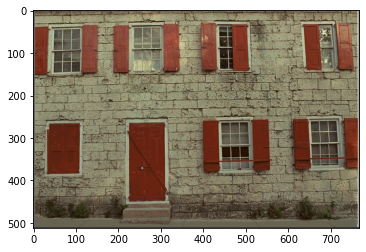

decodeImage
RMSE: 0.032698938787914


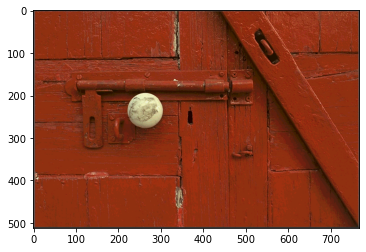

In [110]:
encodeImage = LSBencode(img1,img2)
print("encodeImage")
plt.imshow(encodeImage)
print("RMSE:", RMSE_tensor(img1, encodeImage))
plt.show()
decodeImage = LSBdecode(encodeImage)
print("decodeImage")
print("RMSE:", RMSE_tensor(img2, decodeImage))
plt.imshow(decodeImage)
plt.show()
  
    

encodeImage


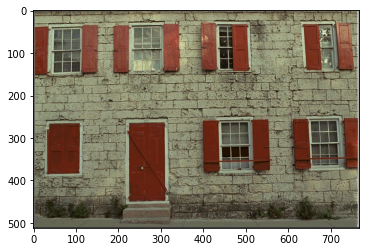

decodeImage


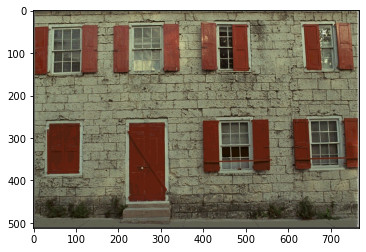

encodeImage


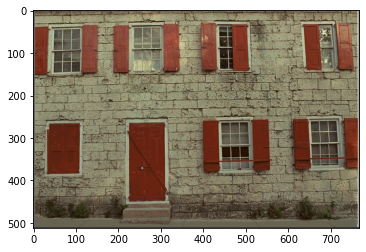

decodeImage


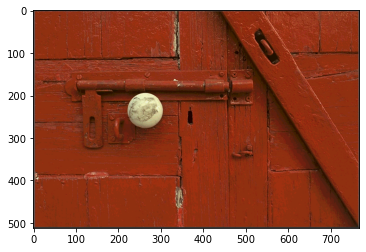

encodeImage


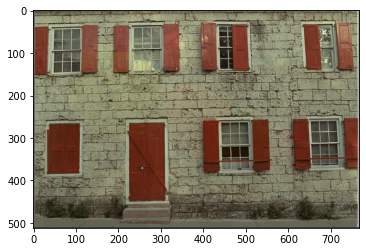

decodeImage


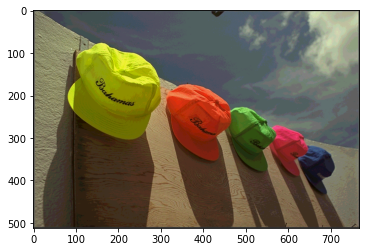

encodeImage


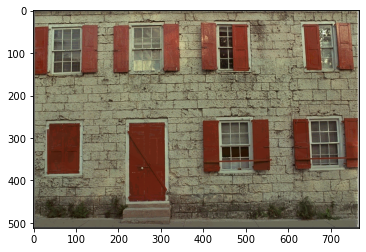

decodeImage


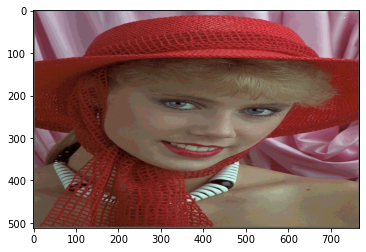

encodeImage


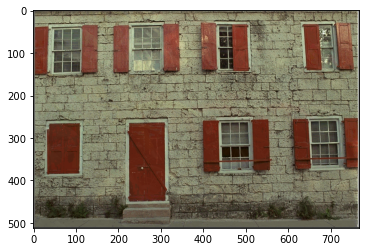

decodeImage


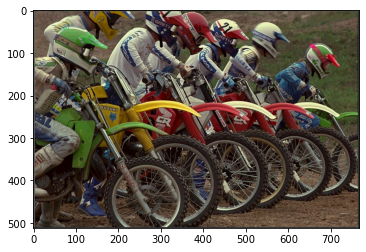

encodeImage


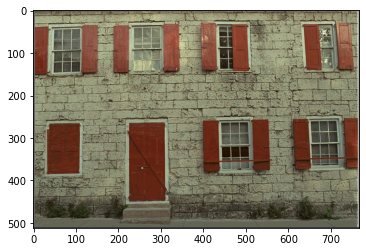

decodeImage


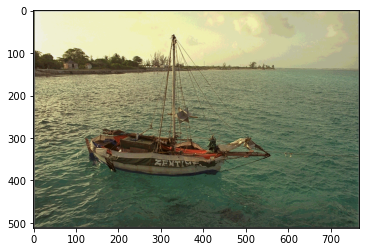

encodeImage


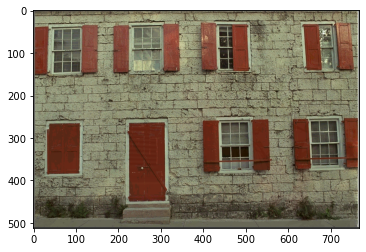

decodeImage


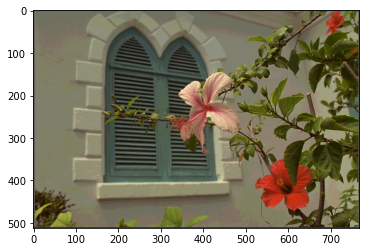

encodeImage


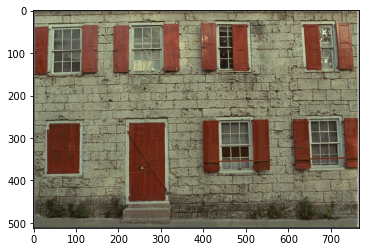

decodeImage


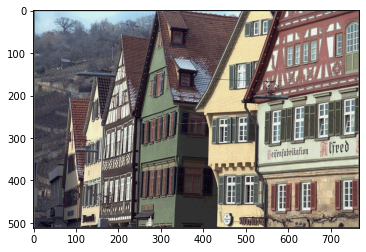

encodeImage


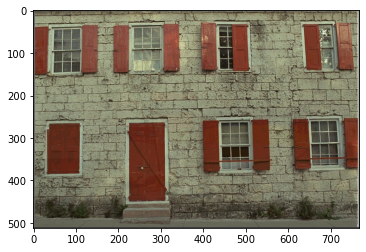

decodeImage


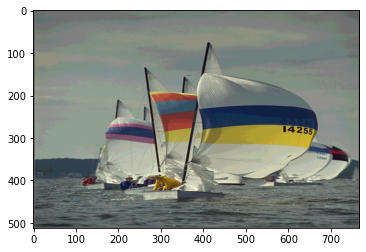

encodeImage


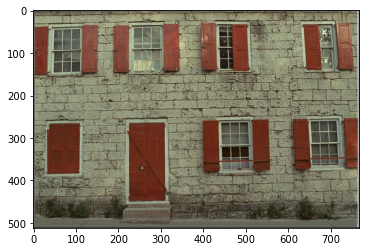

decodeImage


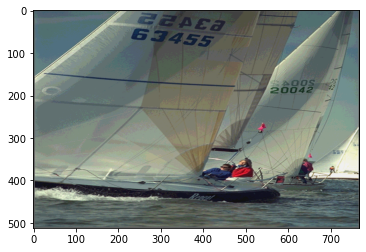

encodeImage


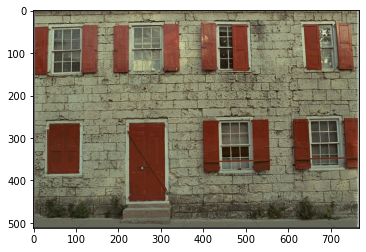

decodeImage


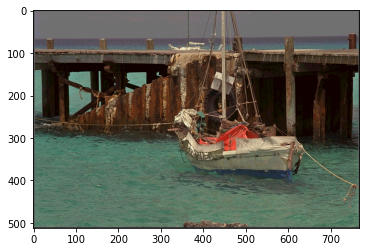

encodeImage


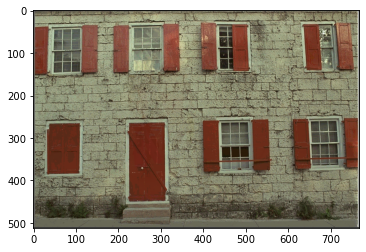

decodeImage


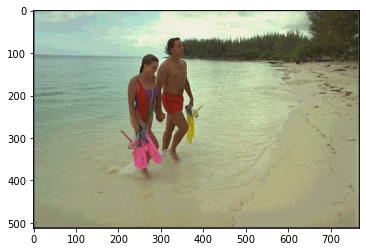

encodeImage


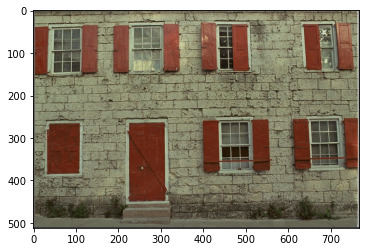

decodeImage


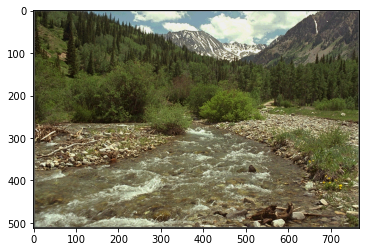

encodeImage


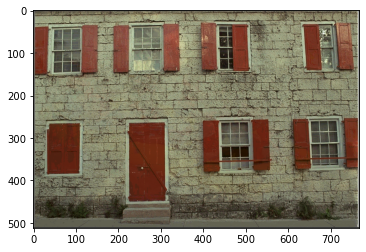

decodeImage


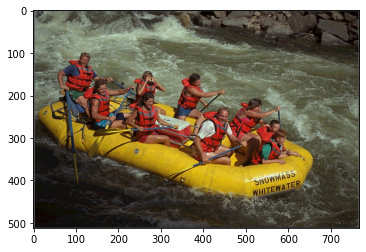

encodeImage


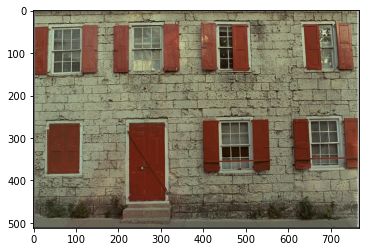

decodeImage


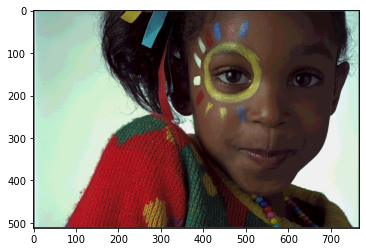

encodeImage


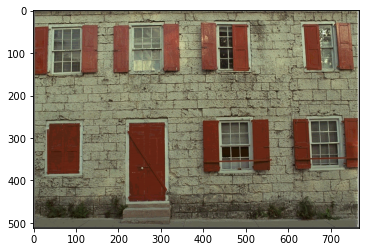

decodeImage


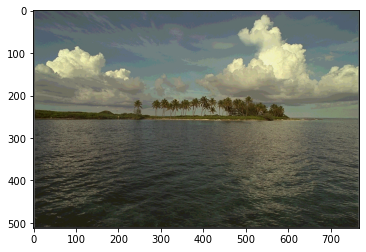

encodeImage


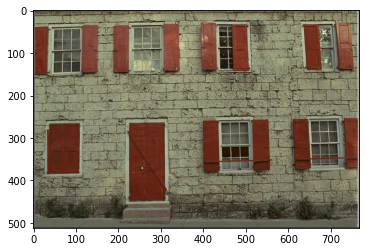

decodeImage


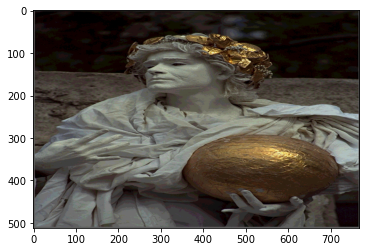

encodeImage


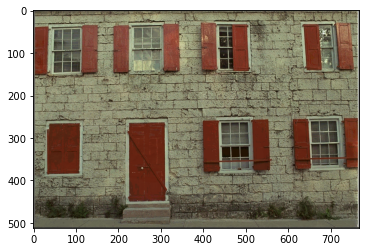

decodeImage


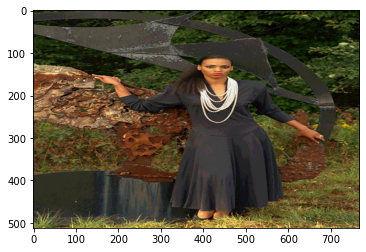

encodeImage


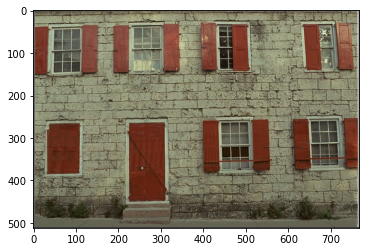

decodeImage


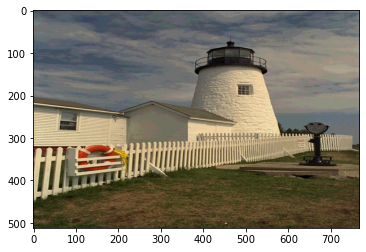

encodeImage


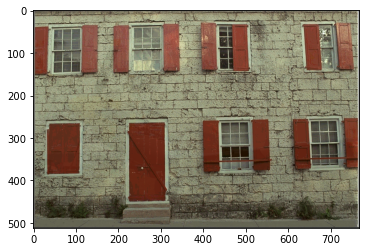

decodeImage


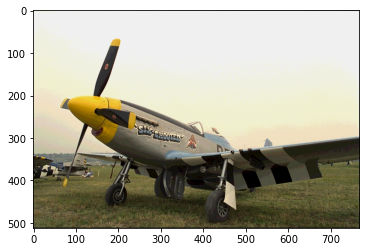

encodeImage


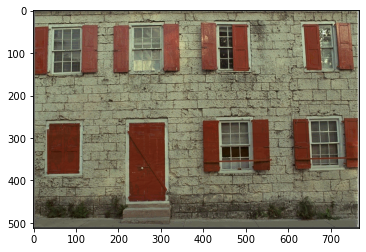

decodeImage


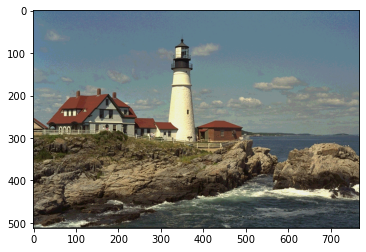

encodeImage


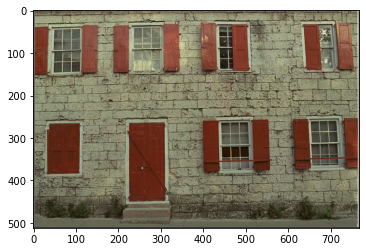

decodeImage


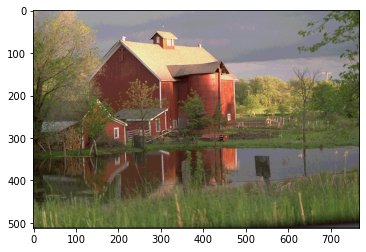

encodeImage


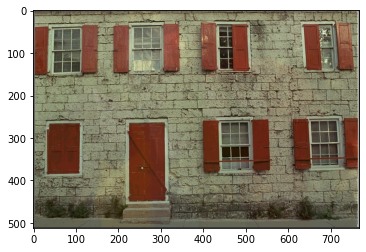

decodeImage


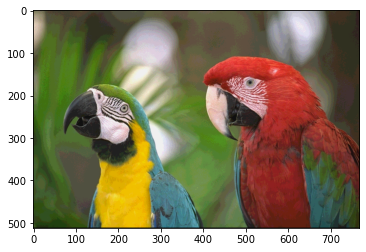

encodeImage


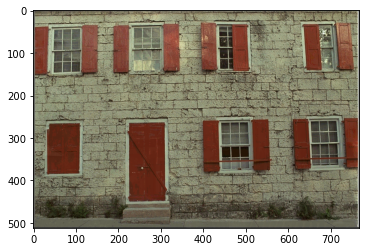

decodeImage


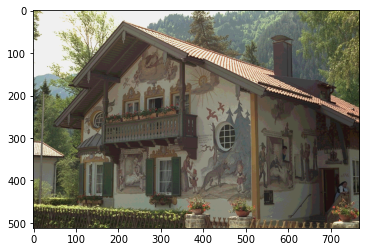

RMSE for encodeImage: 0.023172983161979164
RMSE for decodeImage: 0.035259203533044826


In [112]:
width, height = img1.size
total_RMSE_encode = 0
total_RMSE_decode = 0
for f in myList:
    img2 = Image.open(base_dir + "\\" + f)
    img2 = img2.resize(img1.size)
    encodeImage = LSBencode(img1,img2)
    total_RMSE_encode += RMSE_tensor(img1,encodeImage)
    print("encodeImage")
    plt.imshow(encodeImage)
    plt.show()
    decodeImage = LSBdecode(encodeImage)
    total_RMSE_decode += RMSE_tensor(img2,decodeImage)
    print("decodeImage")
    plt.imshow(decodeImage)
    plt.show()
print("RMSE for encodeImage:", total_RMSE_encode/len(myList))
print("RMSE for decodeImage:", total_RMSE_decode/len(myList))



## Second task
Try to use neural network to approximate $D$ and $E$, the parameters are up to you, the structure is up to you.  This paper provides a good insight: https://papers.nips.cc/paper/6802-hiding-images-in-plain-sight-deep-steganography.pdf,  an implementation is found here: https://github.com/fpingham/DeepSteg/blob/master/DeepSteganography.ipynb, https://github.com/Ankit-Dhankhar/deep-steg/blob/master/steg%20net.py, and https://github.com/mr3coi/deepsteg and https://github.com/alexandremuzio/deep-steg and https://github.com/harveyslash/Deep-Steganography....., a blog https://buzzrobot.com/hiding-images-using-ai-deep-steganography-b7726bd58b06

For the network structure, you can borrow the idea from autoencoder for the $E$ part, in that paper, the authors claimed the $E$ part uses 5 layers of convolutional neural networks with 3x3, 4x4, 5x5 patches. The idea is only to approximate the mappings $D$ and $E$, the fully connected network should also work, but convolutional type is cheaper. 

A good way to combine DCT (discrete-cosine-transform) to reduce the information first on secret images (bypassing the prep network in the paper). References are easy to find by searching google with DCT keywords. 

In [82]:
# Imports necessary libraries and modules
from itertools import islice
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import torch
from torch.autograd import Variable
from torch import utils
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import os 
import pickle
from torchvision import datasets, utils
import torchvision.transforms as transforms
from torchvision.transforms import ToPILImage
from random import shuffle
from IPython.display import Image
import math
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'

In [83]:
# Directory path

cwd = r"picture/coast"

# Hyper Parameters
num_epochs = 3
batch_size = 2
learning_rate = 0.0001
beta = 1

# Mean and std deviation of imagenet dataset. Source: http://cs231n.stanford.edu/reports/2017/pdfs/101.pdf
std = [0.229, 0.224, 0.225]
mean = [0.485, 0.456, 0.406]

# TODO: Define train, validation and models
MODELS_PATH = cwd + r"/Model/"
# TRAIN_PATH = cwd+'/train/'
# VALID_PATH = cwd+'/valid/'
VALID_PATH = cwd+ r"/validation/"
TRAIN_PATH = cwd+ r"/training/"
TEST_PATH = cwd+ r"/present/"

if not os.path.exists(MODELS_PATH): os.mkdir(MODELS_PATH)

In [122]:
def customized_loss(S_prime, C_prime, S, C, B):
    ''' Calculates loss specified on the paper.'''
    
    loss_cover = math.sqrt(torch.nn.functional.mse_loss(C_prime, C))
    loss_secret = math.sqrt(torch.nn.functional.mse_loss(S_prime, S))
    loss_all = loss_cover + B * loss_secret
    return loss_all, loss_cover, loss_secret


def denormalize(image, std, mean):
    ''' Denormalizes a tensor of images.'''

    for t in range(3):
        image[t, :, :] = (image[t, :, :] * std[t]) + mean[t]
    return image

def imshow(img, idx, learning_rate, beta):
    '''Prints out an image given in tensor format.'''
    img = denormalize(img, std, mean)
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.title('Example '+str(idx)+', lr='+str(learning_rate)+', B='+str(beta))
    plt.show()
    return

def gaussian(tensor, mean=0, stddev=0.1):
    '''Adds random noise to a tensor.'''
    noise = torch.nn.init.normal(torch.Tensor(tensor.size()), 0, 0.1)
    return Variable(tensor + noise)


In [123]:
# Preparation Network (2 conv layers)
class PrepNetwork(nn.Module):
    def __init__(self):
        super(PrepNetwork, self).__init__()
        self.initialP3 = nn.Sequential(
            nn.Conv2d(3, 50, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=3, padding=1),
            nn.ReLU())
        self.initialP4 = nn.Sequential(
            nn.Conv2d(3, 50, kernel_size=4, padding=1),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=4, padding=2),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=4, padding=1),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=4, padding=2),
            nn.ReLU())
        self.initialP5 = nn.Sequential(
            nn.Conv2d(3, 50, kernel_size=5, padding=2),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=5, padding=2),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=5, padding=2),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=5, padding=2),
            nn.ReLU())
        self.finalP3 = nn.Sequential(
            nn.Conv2d(150, 50, kernel_size=3, padding=1),
            nn.ReLU())
        self.finalP4 = nn.Sequential(
            nn.Conv2d(150, 50, kernel_size=4, padding=1),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=4, padding=2),
            nn.ReLU())
        self.finalP5 = nn.Sequential(
            nn.Conv2d(150, 50, kernel_size=5, padding=2),
            nn.ReLU())

    def forward(self, p):
        p1 = self.initialP3(p)
        p2 = self.initialP4(p)
        p3 = self.initialP5(p)
        mid = torch.cat((p1, p2, p3), 1)
        p4 = self.finalP3(mid)
        p5 = self.finalP4(mid)
        p6 = self.finalP5(mid)
        out = torch.cat((p4, p5, p6), 1)
        return out

# Hiding Network (5 conv layers)
class HidingNetwork(nn.Module):
    def __init__(self):
        super(HidingNetwork, self).__init__()
        self.initialH3 = nn.Sequential(
            nn.Conv2d(153, 50, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=3, padding=1),
            nn.ReLU())
        self.initialH4 = nn.Sequential(
            nn.Conv2d(153, 50, kernel_size=4, padding=1),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=4, padding=2),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=4, padding=1),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=4, padding=2),
            nn.ReLU())
        self.initialH5 = nn.Sequential(
            nn.Conv2d(153, 50, kernel_size=5, padding=2),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=5, padding=2),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=5, padding=2),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=5, padding=2),
            nn.ReLU())
        self.finalH3 = nn.Sequential(
            nn.Conv2d(150, 50, kernel_size=3, padding=1),
            nn.ReLU())
        self.finalH4 = nn.Sequential(
            nn.Conv2d(150, 50, kernel_size=4, padding=1),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=4, padding=2),
            nn.ReLU())
        self.finalH5 = nn.Sequential(
            nn.Conv2d(150, 50, kernel_size=5, padding=2),
            nn.ReLU())
        self.finalH = nn.Sequential(
            nn.Conv2d(150, 3, kernel_size=1, padding=0))
        
    def forward(self, h):
        h1 = self.initialH3(h)
        h2 = self.initialH4(h)
        h3 = self.initialH5(h)
        mid = torch.cat((h1, h2, h3), 1)
        h4 = self.finalH3(mid)
        h5 = self.finalH4(mid)
        h6 = self.finalH5(mid)
        mid2 = torch.cat((h4, h5, h6), 1)
        out = self.finalH(mid2)
        out_noise = gaussian(out.data, 0, 0.1)
        return out, out_noise

# Reveal Network (2 conv layers)
class RevealNetwork(nn.Module):
    def __init__(self):
        super(RevealNetwork, self).__init__()
        self.initialR3 = nn.Sequential(
            nn.Conv2d(3, 50, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=3, padding=1),
            nn.ReLU())
        self.initialR4 = nn.Sequential(
            nn.Conv2d(3, 50, kernel_size=4, padding=1),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=4, padding=2),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=4, padding=1),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=4, padding=2),
            nn.ReLU())
        self.initialR5 = nn.Sequential(
            nn.Conv2d(3, 50, kernel_size=5, padding=2),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=5, padding=2),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=5, padding=2),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=5, padding=2),
            nn.ReLU())
        self.finalR3 = nn.Sequential(
            nn.Conv2d(150, 50, kernel_size=3, padding=1),
            nn.ReLU())
        self.finalR4 = nn.Sequential(
            nn.Conv2d(150, 50, kernel_size=4, padding=1),
            nn.ReLU(),
            nn.Conv2d(50, 50, kernel_size=4, padding=2),
            nn.ReLU())
        self.finalR5 = nn.Sequential(
            nn.Conv2d(150, 50, kernel_size=5, padding=2),
            nn.ReLU())
        self.finalR = nn.Sequential(
            nn.Conv2d(150, 3, kernel_size=1, padding=0))

    def forward(self, r):
        r1 = self.initialR3(r)
        r2 = self.initialR4(r)
        r3 = self.initialR5(r)
        mid = torch.cat((r1, r2, r3), 1)
        r4 = self.finalR3(mid)
        r5 = self.finalR4(mid)
        r6 = self.finalR5(mid)
        mid2 = torch.cat((r4, r5, r6), 1)
        out = self.finalR(mid2)
        return out

# Join three networks in one module
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.m1 = PrepNetwork()
        self.m2 = HidingNetwork()
        self.m3 = RevealNetwork()

    def forward(self, secret, cover):
        x_1 = self.m1(secret)
        mid = torch.cat((x_1, cover), 1)
        x_2, x_2_noise = self.m2(mid)
        x_3 = self.m3(x_2_noise)
        return x_2, x_3

In [124]:
# Creates net object
net = Net()

In [125]:
# Creates training set
train_loader = torch.utils.data.DataLoader(
        datasets.ImageFolder(
        TRAIN_PATH,
        transforms.Compose([
        transforms.Resize(256),
        transforms.RandomCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=mean,
        std=std)
        ])), batch_size=batch_size, num_workers=1, 
        pin_memory=True, shuffle=True, drop_last=True)

# Creates test set
test_loader = torch.utils.data.DataLoader(
        datasets.ImageFolder(
        TEST_PATH, 
        transforms.Compose([
        transforms.Resize(256),
        transforms.RandomCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=mean,
        std=std)
        ])), batch_size=2, num_workers=1, 
        pin_memory=True, shuffle=True, drop_last=True)

In [126]:
def train_model(train_loader, beta, learning_rate):
    
    # Save optimizer
    optimizer = optim.Adam(net.parameters(), lr=learning_rate)
    
    loss_history = []
    # Iterate over batches performing forward and backward passes
    for epoch in range(num_epochs):

        # Train mode
        net.train()
        
        train_losses = []
        # Train one epoch
        for idx, train_batch in enumerate(train_loader):

            data, _  = train_batch

            # Saves secret images and secret covers
            train_covers = data[:len(data)//2]
            train_secrets = data[len(data)//2:]
            
            # Creates variable from secret and cover images
            train_secrets = Variable(train_secrets, requires_grad=False)
            train_covers = Variable(train_covers, requires_grad=False)

            # Forward + Backward + Optimize
            optimizer.zero_grad()
            train_hidden, train_output = net(train_secrets, train_covers)
  
            # Calculate loss and perform backprop
            train_loss, train_loss_cover, train_loss_secret = customized_loss(train_output, train_hidden, train_secrets, train_covers, beta)
            train_loss.backward()
            optimizer.step()
            
            # Saves training loss
            train_losses.append(train_loss.data)
            loss_history.append(train_loss.data)
            
            # Prints mini-batch losses
            print('Training: Batch {0}/{1}. Loss of {2:.4f}, cover loss of {3:.4f}, secret loss of {4:.4f}'.format(idx+1, len(train_loader), (train_loss.data), (train_loss_cover.data), (train_loss_secret.data)))
    
        torch.save(net.state_dict(), MODELS_PATH+'Epoch N{}.pkl'.format(epoch+1))
        
        mean_train_loss = np.mean(train_losses)
    
        # Prints epoch average loss
        print ('Epoch [{0}/{1}], Average_loss: {2:.4f}'.format(
                epoch+1, num_epochs, mean_train_loss))
    
    return net, mean_train_loss, loss_history

In [94]:
net, mean_train_loss, loss_history = train_model(train_loader, beta, learning_rate)


<ipython-input-84-305b16ed3af0>:39: UserWarning: nn.init.normal is now deprecated in favor of nn.init.normal_.
  noise = torch.nn.init.normal(torch.Tensor(tensor.size()), 0, 0.1)


tensor([[[[-0.0199, -0.0215, -0.0224,  ..., -0.0222, -0.0198, -0.0197],
          [-0.0192, -0.0213, -0.0213,  ..., -0.0203, -0.0193, -0.0185],
          [-0.0193, -0.0212, -0.0215,  ..., -0.0200, -0.0197, -0.0180],
          ...,
          [-0.0196, -0.0220, -0.0221,  ..., -0.0205, -0.0199, -0.0181],
          [-0.0187, -0.0198, -0.0191,  ..., -0.0184, -0.0172, -0.0167],
          [-0.0177, -0.0178, -0.0175,  ..., -0.0180, -0.0168, -0.0151]],

         [[-0.0296, -0.0296, -0.0313,  ..., -0.0313, -0.0299, -0.0291],
          [-0.0298, -0.0301, -0.0318,  ..., -0.0323, -0.0301, -0.0304],
          [-0.0322, -0.0329, -0.0347,  ..., -0.0342, -0.0321, -0.0308],
          ...,
          [-0.0324, -0.0322, -0.0345,  ..., -0.0351, -0.0324, -0.0308],
          [-0.0316, -0.0318, -0.0321,  ..., -0.0328, -0.0301, -0.0304],
          [-0.0295, -0.0305, -0.0319,  ..., -0.0315, -0.0301, -0.0296]],

         [[-0.0683, -0.0670, -0.0681,  ..., -0.0676, -0.0678, -0.0685],
          [-0.0687, -0.0681, -

Training: Batch 6/143. Loss of 2.3852, cover loss of 1.2065, secret loss of 1.1787


KeyboardInterrupt: 

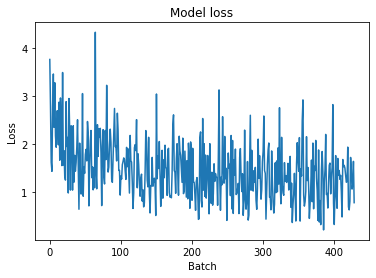

In [20]:
# Plot loss through epochs
plt.plot(loss_history)
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Batch')
plt.show()

<ipython-input-122-91837e67e0c5>:28: UserWarning: nn.init.normal is now deprecated in favor of nn.init.normal_.
  noise = torch.nn.init.normal(torch.Tensor(tensor.size()), 0, 0.1)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.83 
Loss on secret: 0.62 
Loss on cover: 0.22


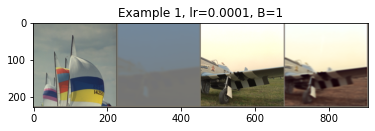

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.13 
Loss on secret: 0.89 
Loss on cover: 0.24


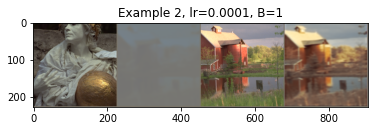

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.53 
Loss on secret: 1.25 
Loss on cover: 0.28


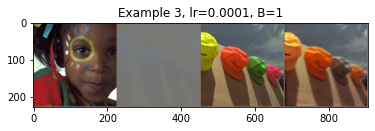

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.27 
Loss on secret: 1.09 
Loss on cover: 0.18


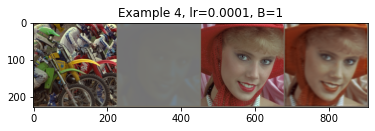

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.45 
Loss on secret: 1.06 
Loss on cover: 0.38


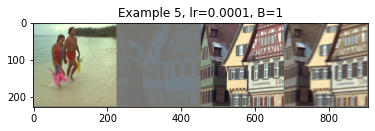

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 0.96 
Loss on secret: 0.72 
Loss on cover: 0.25


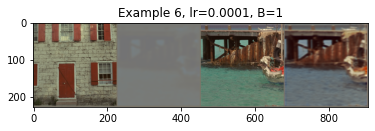

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.32 
Loss on secret: 1.03 
Loss on cover: 0.29


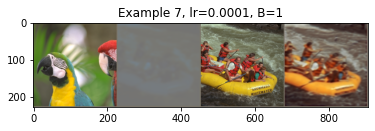

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.00 
Loss on secret: 0.70 
Loss on cover: 0.29


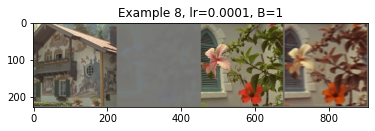

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.46 
Loss on secret: 1.23 
Loss on cover: 0.22


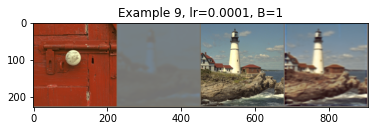

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.18 
Loss on secret: 0.95 
Loss on cover: 0.23


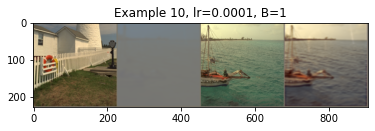

Total loss: 0.85 
Loss on secret: 0.59 
Loss on cover: 0.26


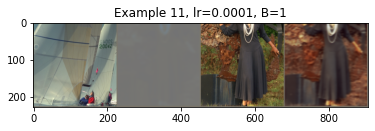

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Total loss: 1.10 
Loss on secret: 0.79 
Loss on cover: 0.31


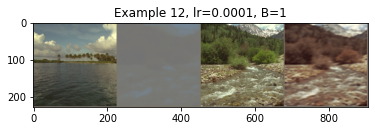

Average loss on test set: 1.17
Average loss on secret: 0.91
Average loss on cover:0.26


In [132]:
net.load_state_dict(torch.load(MODELS_PATH+'Epoch N3.pkl'))

# Switch to evaluate mode
net.eval()
test_covers= []
test_losses = []
test_secrets = []
# Show images
for idx, test_batch in enumerate(test_loader):
     # Saves images
    data, _ = test_batch

    # Saves secret images and secret covers
    test_secret = data[:len(data)//2]
    test_cover = data[len(data)//2:]

    # Creates variable from secret and cover images
    with torch.no_grad():
        test_secret = Variable(test_secret)
        test_cover = Variable(test_cover)

    # Compute output
    test_hidden, test_output = net(test_secret, test_cover)
    
    # Calculate loss
    test_loss, loss_cover, loss_secret = customized_loss(test_output, test_hidden, test_secret, test_cover, beta)
    
#     diff_S, diff_C = np.abs(np.array(test_output.data[0]) - np.array(test_secret.data[0])), np.abs(np.array(test_hidden.data[0]) - np.array(test_cover.data[0]))
    
#     print (diff_S, diff_C)
    
    if idx in range(20):
        print ('Total loss: {:.2f} \nLoss on secret: {:.2f} \nLoss on cover: {:.2f}'.format(test_loss, loss_secret, loss_cover))

        # Creates img tensor
        imgs = [test_secret.data, test_output.data, test_cover.data, test_hidden.data]
        imgs_tsor = torch.cat(imgs, 0)

        # Prints Images
        imshow(utils.make_grid(imgs_tsor), idx+1, learning_rate=learning_rate, beta=beta)
        
    test_losses.append(test_loss)
    test_secrets.append(loss_secret)
    test_covers.append(loss_cover)
mean_test_loss = np.mean(test_losses)
mean_cover_loss = np.mean(test_covers)
mean_secret_loss = np.mean(test_secrets)
print ('Average loss on test set: {:.2f}\nAverage loss on secret: {:.2f}\nAverage loss on cover:{:.2f}'.format(mean_test_loss, mean_secret_loss, mean_cover_loss))

## Optional Task

What if you have two secret images to encrpt, what if there are more. Does LSB work? Does the NN work? 

## Data set 

https://www.kaggle.com/gaz3ll3/optimization-ii-project-3

In order to efficiency, we only consider small pictures, 256x256. If you have problem dealing with 256x256, you can resize them to 128x128 or 64x64.  If you feel the images are too many, you can sample a portion from them as well.  

Training and Validation sets are chosen at random (say, 80% and 20%). Each input data will be two images from the training set. 

If you are more comfortable with other data sets, it is up to you. Say you can use https://tiny-imagenet.herokuapp.com/ for 64x64 small images.

## Metric

In your trainging process for $D$ and $E$, the norm to compare images is the RMSE (root mean squared error), the images are of dimension $N\times N\times 3$, BTW.

## Your final result


1.   A writeup on your work, including performance, your work, issues, how do you solve the issues, etc. 
2.   Test your codes (LSB and NN) against the data set http://r0k.us/graphics/kodak/, each image will be downsize to 256x256 or 128x128 or 64x64 if you trained an NN on smaller images. Report your result in your writeup. 
3. Code, again, host on github. Submission will be a link. 
4. If you also tried the optional task, please also report that in your writeup.




In [ ]:
print('Good luck!')